# Object Size

Extract size relations (>, <) by clustering objects in images based on area * depth.


In [1]:
import numpy as np
from glob import glob
from PIL import Image
from os.path import join as osj
import matplotlib.pyplot as plt
from matplotlib.pyplot import Rectangle
from jenkspy import JenksNaturalBreaks
from utils import read_json

In [2]:
_DIR = '../../../Datasets/Visual_Genome/'

In [3]:
regions = read_json(_DIR + '/regions/r_1.json')
reg_objs = read_json(_DIR + '/reg_obj_subtype/ros_1.json')


In [4]:
def _get_img_paths(_dir: str) -> dict:
    _p1 = glob(osj(_dir, 'images_1', '*.jpg'))
    _p2 = glob(osj(_dir, 'images_2', '*.jpg'))

    img_paths = _p1 + _p2

    def _path2id(p: str):
        p = p.split('/')[-1]
        p = p.split('.')[0]
        return int(p)

    img_id2path = {}
    for path in img_paths:
        # get id from path
        img_id = _path2id(path)

        img_id2path[img_id] = path

    return img_id2path


id2paths = _get_img_paths(_DIR)

In [25]:
def _annotate(ax, box: list, label: str, color='red', lw=1):
    x, y, w, h = box
    # text
    ax.text(x, y - 5, label, fontsize=12, color='black', bbox={'facecolor': 'white', 'alpha': 0.4})
    # bbox
    rect = Rectangle((x, y), w, h, edgecolor=color, facecolor='none', lw=lw)
    ax.add_patch(rect)


def plot_img(reg: dict, ros: dict, N):
    im_id = reg['image_id']
    path = id2paths[im_id]

    img = Image.open(path)
    dpt = Image.open(path.replace('images', 'depth'))

    plt.figure(figsize=(14, 14))
    plt.imshow(img)

    # reference
    axes = plt.gca()

    for r, o in list(zip(reg['regions'], ros['ros']))[:N]:
        # Box
        bbox = [r['x'], r['y'], r['width'], r['height']]
        # Objects
        text = ' '.join(o)
        # Scaled Area
        area = _compute_area(bbox, dpt)
        text += f': {area}'

        _annotate(axes, bbox, text)

    plt.show()


def _compute_area(box, depth):
    # box -> coordinates
    x1, y1, w, h = box
    x2, y2 = x1+w, y1+h

    # image dims
    im_w, im_h = depth.size

    # normalize
    depth = np.array(depth) / 255
    w /= im_w
    h /= im_h

    # box mask
    mask = np.zeros_like(depth)
    mask[x1: x2, y1: y2] = 1

    # mean box depth
    dpt = np.mean(depth*mask)

    area = w * h * (1 - dpt)

    return area

In [6]:
_idx = 0

r_im = regions[_idx]
o_im = reg_objs[_idx]

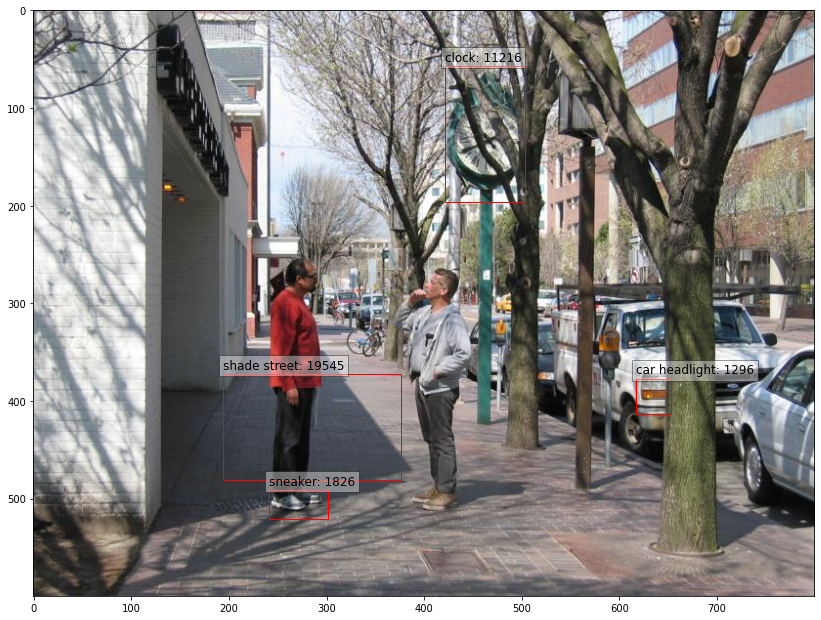

In [7]:
plot_img(r_im, o_im, N=4)

### Clustering

Jenks NB algorithm for 1D data.


In [8]:
jnb = JenksNaturalBreaks(nb_class=3)

def _cluster(array):
    jnb.fit(array)
    return jnb.labels_

In [29]:
COLORS = ['white', 'gold', 'red', 'brown', 'black']


def plot_obj_cluster(reg: dict, ros: dict, N):
    im_id = reg['image_id']
    path = id2paths[im_id]

    # Load
    img = Image.open(path)
    dpt = Image.open(path.replace('images', 'depth'))

    plt.figure(figsize=(14, 14))
    plt.imshow(img)

    # Reference
    axes = plt.gca()

    data = []
    for r, o in list(zip(reg['regions'], ros['ros']))[:N]:
        # Box
        bbox = [r['x'], r['y'], r['width'], r['height']]
        # Objects
        text = ' | '.join(o.values())
        # Scaled Area
        area = _compute_area(bbox, dpt)
        text += f': {area*100: .2f}'

        d = dict(bbox=bbox, text=text, area=area)
        data += [d]

    # Cluster
    areas = [d['area'] for d in data]
    clusters = _cluster(areas)

    # Plot
    for d, c_id in zip(data, clusters):
        _annotate(axes, d['bbox'], d['text'], color=COLORS[c_id], lw=2)

    plt.show()

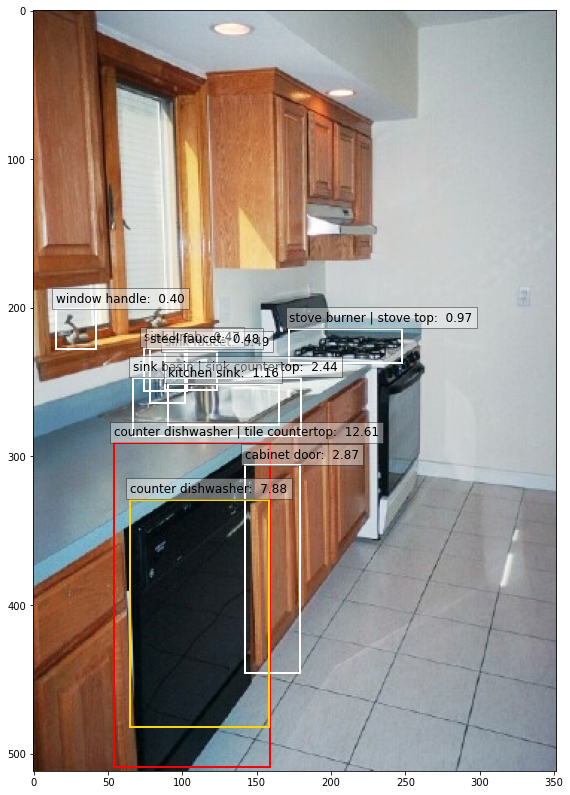

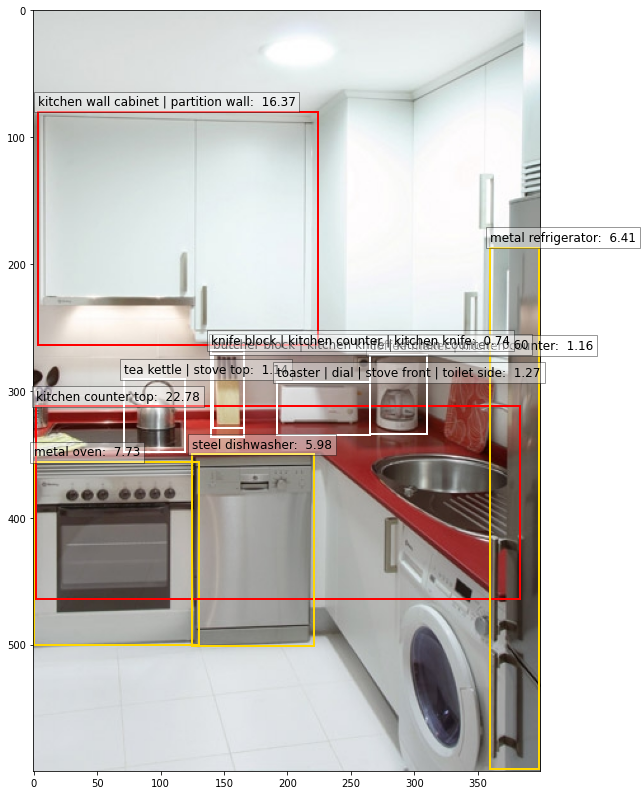

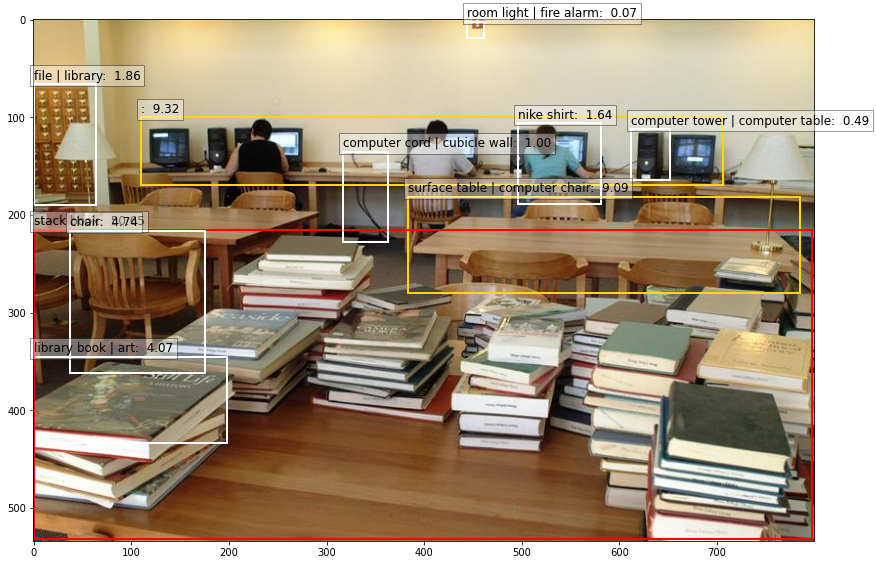

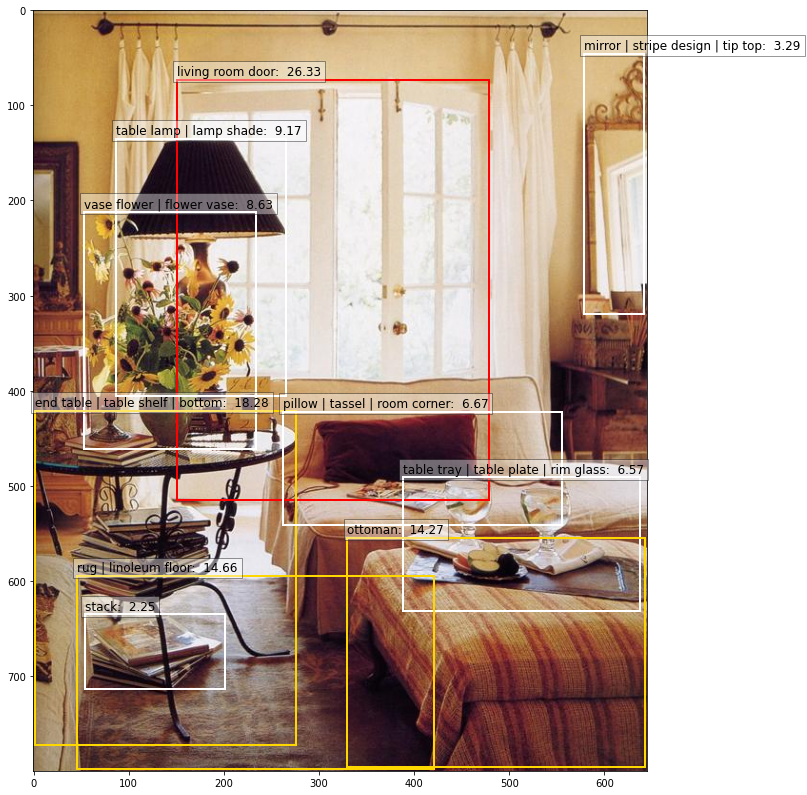

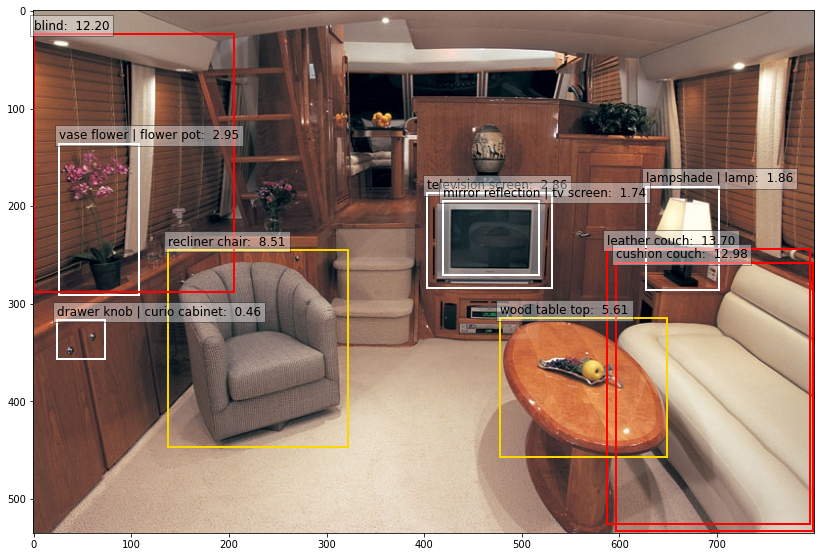

...

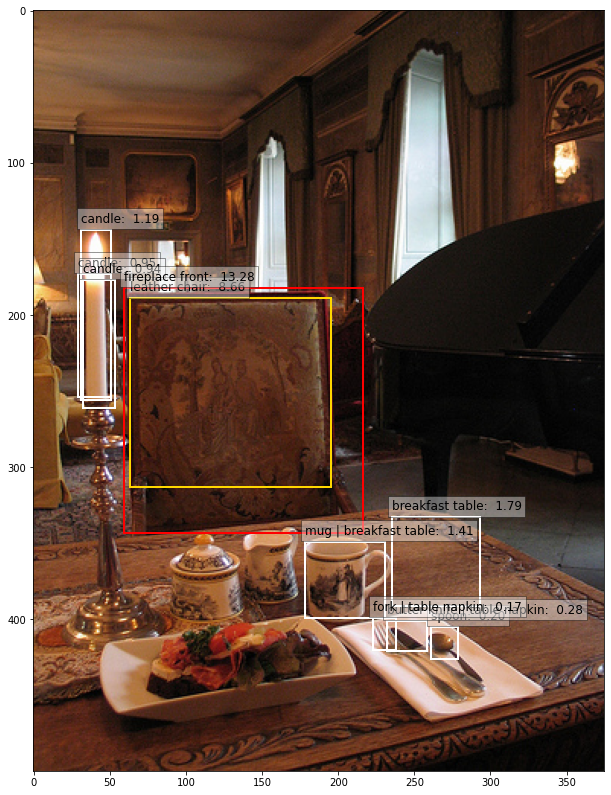

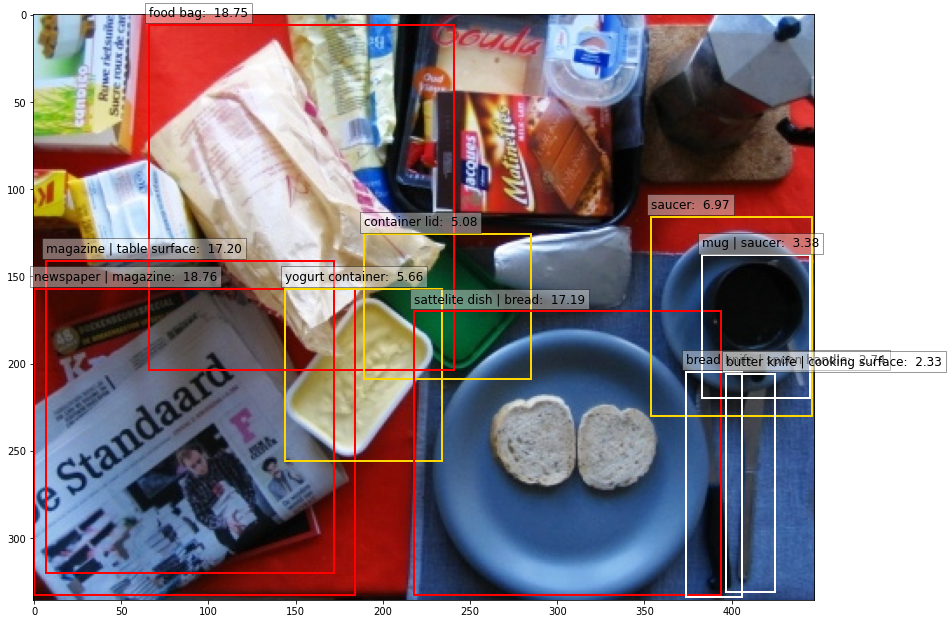

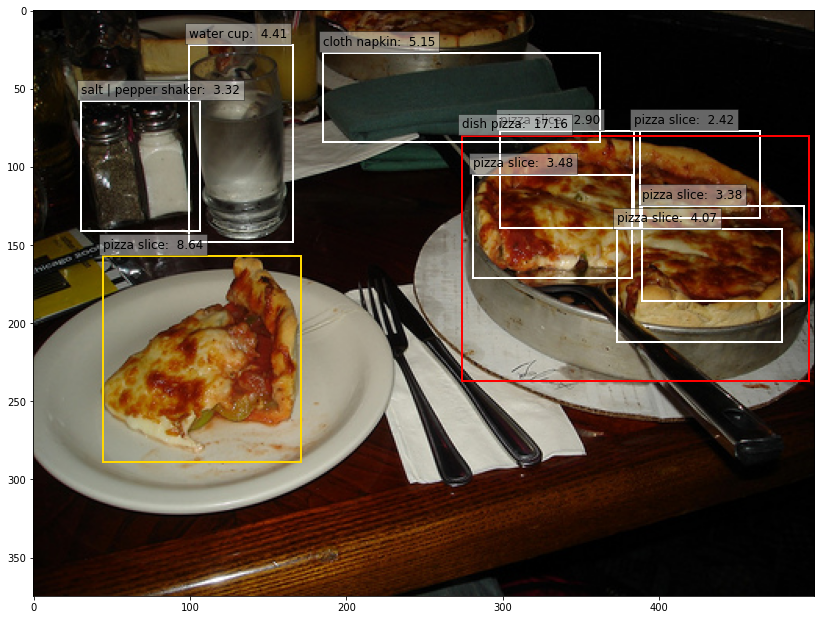

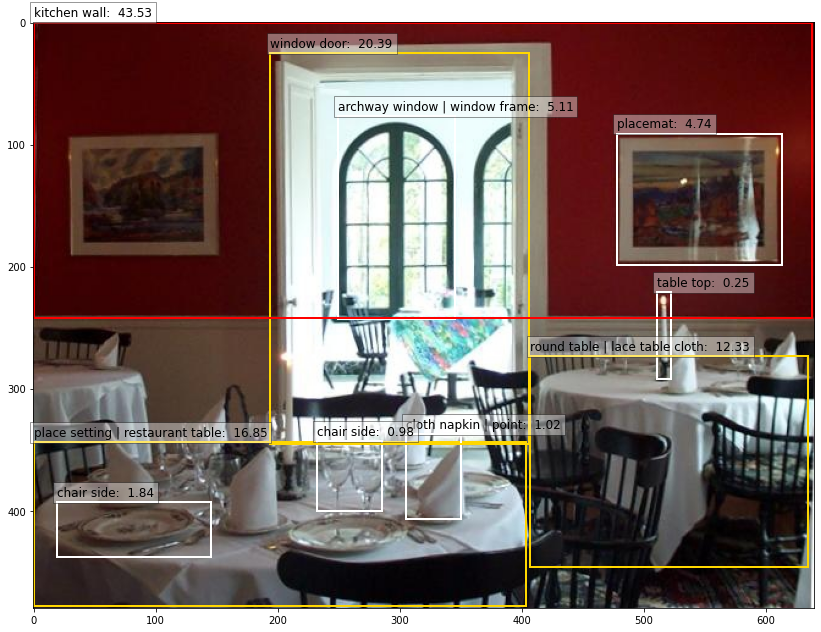

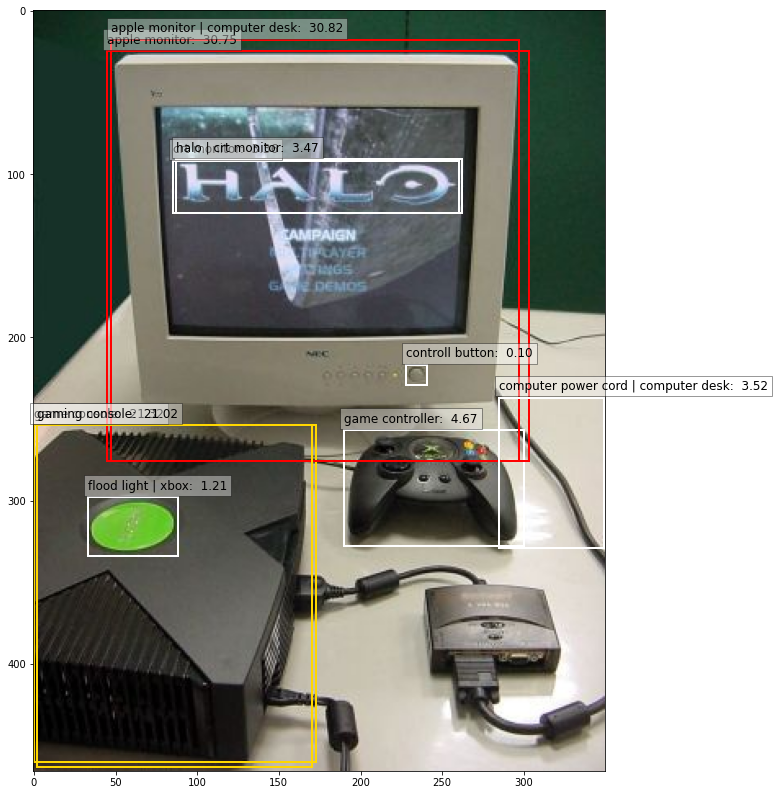

In [33]:
S, E = 80, 100

for _idx in range(S, E):
    r_im = regions[_idx]
    o_im = reg_objs[_idx]

    plot_obj_cluster(r_im, o_im, N=10)